# Lab 3 Assignment
### Authors: Dan Davieau, Paul Panek, Olga Tanyuk, Nathan Wall

In [1]:
import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, iplot_mpl
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
print(__version__)# requires version >= 1.9.0
init_notebook_mode(connected=True)
import pandas as pd
import numpy as np
import seaborn as sns

3.4.1


In [2]:
# import os
# path="C:/Users/danie/Documents/GitHub/DataMiningGroupProjects/Lab 3"
# os.chdir(path)
df1 = pd.read_csv('Data/raw_residential_data.csv', low_memory=False)
df1.info()

df2 = pd.read_csv('Data/raw_address_points.csv', low_memory=False)
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107154 entries, 0 to 107153
Data columns (total 39 columns):
OBJECTID             107154 non-null int64
SSL                  107154 non-null object
BATHRM               107127 non-null float64
HF_BATHRM            107126 non-null float64
HEAT                 107127 non-null float64
HEAT_D               107127 non-null object
AC                   107127 non-null object
NUM_UNITS            107127 non-null float64
ROOMS                107110 non-null float64
BEDRM                107123 non-null float64
AYB                  107141 non-null float64
YR_RMDL              49446 non-null float64
EYB                  107154 non-null int64
STORIES              107080 non-null float64
SALEDATE             107154 non-null object
PRICE                87866 non-null float64
QUALIFIED            107154 non-null object
SALE_NUM             107154 non-null int64
GBA                  107154 non-null int64
BLDG_NUM             107154 non-null int64
STYLE 

In [3]:
#Identify all categorical variables
categories = [['CNDTN_D','CNDTN'],['HEAT_D','HEAT'],['STYLE_D','STYLE'],['STRUCT_D','STRUCT'],['GRADE_D','GRADE'],['ROOF_D','ROOF'],['EXTWALL_D','EXTWALL'],['INTWALL_D','INTWALL']]
cat_drop = []
for c in categories:
    round(df1[c[1]])
    cat_drop.append(c[0])
    
# eliminate redundant dummy variables
df1.drop(cat_drop, inplace=True, axis=1)
df1.head()


,OBJECTID,SSL,BATHRM,HF_BATHRM,HEAT,AC,NUM_UNITS,ROOMS,BEDRM,AYB,...,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,GIS_LAST_MOD_DTTM
0,1001,0152 0133,4.0,0.0,7.0,Y,2.0,8.0,4.0,1910.0,...,6.0,4.0,14.0,6.0,6.0,2.0,5.0,24,1680,2018-07-22T18:01:43.000Z
1,1002,0152 0134,3.0,1.0,7.0,Y,2.0,11.0,5.0,1898.0,...,6.0,4.0,14.0,2.0,6.0,2.0,4.0,24,1680,2018-07-22T18:01:43.000Z
2,1003,0152 0135,3.0,1.0,13.0,Y,2.0,9.0,5.0,1910.0,...,6.0,5.0,14.0,2.0,6.0,2.0,4.0,24,1680,2018-07-22T18:01:43.000Z
3,1004,0152 0136,3.0,1.0,13.0,Y,2.0,8.0,5.0,1900.0,...,6.0,4.0,14.0,2.0,6.0,2.0,3.0,24,1680,2018-07-22T18:01:43.000Z
4,1005,0152 0138,2.0,1.0,7.0,Y,1.0,11.0,3.0,1913.0,...,6.0,4.0,14.0,13.0,6.0,1.0,0.0,13,2032,2018-07-22T18:01:43.000Z


In [4]:
bins = [0, 1960, 1970, 1980, 1990, 2000, 2010, 2020]
labels = ['50+','50','40','30','20','10','0']
df1['YR_RMDL_ClASS'] = pd.cut(df1['YR_RMDL'], bins=bins, labels=labels)
df1['YR_RMDL_ClASS'] = df1['YR_RMDL_ClASS'].replace(np.nan, 'NONE', regex=True)

# eliminate unnecessary variables
df1.drop(['PRICE','QUALIFIED','BLDG_NUM','GRADE','CNDTN','EYB','USECODE','GIS_LAST_MOD_DTTM','YR_RMDL','SALEDATE'], inplace=True, axis=1)

In [5]:
from sklearn.base import TransformerMixin
class DataFrameImputer(TransformerMixin):
    def __init__(self):
        """Impute missing values.

        Columns of dtype object are imputed with the most frequent value 
        in column.

        Columns of other types are imputed with mean of column.

        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].median() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

df = DataFrameImputer().fit_transform(df1)

int_col = ['BATHRM','HF_BATHRM','HEAT','NUM_UNITS','ROOMS','BEDRM','AYB','STORIES','STYLE','STRUCT',
           'EXTWALL','ROOF','INTWALL','KITCHENS','FIREPLACES','LANDAREA']

for i in int_col:
    df[i] = df[i].astype('int64')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107154 entries, 0 to 107153
Data columns (total 22 columns):
OBJECTID         107154 non-null int64
SSL              107154 non-null object
BATHRM           107154 non-null int64
HF_BATHRM        107154 non-null int64
HEAT             107154 non-null int64
AC               107154 non-null object
NUM_UNITS        107154 non-null int64
ROOMS            107154 non-null int64
BEDRM            107154 non-null int64
AYB              107154 non-null int64
STORIES          107154 non-null int64
SALE_NUM         107154 non-null int64
GBA              107154 non-null int64
STYLE            107154 non-null int64
STRUCT           107154 non-null int64
EXTWALL          107154 non-null int64
ROOF             107154 non-null int64
INTWALL          107154 non-null int64
KITCHENS         107154 non-null int64
FIREPLACES       107154 non-null int64
LANDAREA         107154 non-null int64
YR_RMDL_ClASS    107154 non-null object
dtypes: int64(19), object(3)

In [6]:
#removal false records
df = df[df.STORIES < 10]
df = df[df.AYB > 1500]
df = df[df.STYLE < 25]
df = df[df.KITCHENS < 20]
df = df[df.ROOMS < 100]
df = df[df.ROOMS >= df.BEDRM]
df = df[df.GBA < 3200]

In [7]:
# subset the variables of interest that we care about
df2 = df2.drop_duplicates(['SSL'], keep='last').set_index("SSL")[["LATITUDE","LONGITUDE","ASSESSMENT_NBHD","WARD"]]
# inner join the two datasets 
df = pd.merge(df,df2,how="inner",on="SSL")

df.info()

# df.to_csv('Data/JoinedDataFrames.csv')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100089 entries, 0 to 100088
Data columns (total 26 columns):
OBJECTID           100089 non-null int64
SSL                100089 non-null object
BATHRM             100089 non-null int64
HF_BATHRM          100089 non-null int64
HEAT               100089 non-null int64
AC                 100089 non-null object
NUM_UNITS          100089 non-null int64
ROOMS              100089 non-null int64
BEDRM              100089 non-null int64
AYB                100089 non-null int64
STORIES            100089 non-null int64
SALE_NUM           100089 non-null int64
GBA                100089 non-null int64
STYLE              100089 non-null int64
STRUCT             100089 non-null int64
EXTWALL            100089 non-null int64
ROOF               100089 non-null int64
INTWALL            100089 non-null int64
KITCHENS           100089 non-null int64
FIREPLACES         100089 non-null int64
LANDAREA           100089 non-null int64
YR_RMDL_ClASS      100089 

# From here down is all new stuff with write-ups

### Data Evaluation 2

In [8]:
x = df.LATITUDE
y = df.LONGITUDE
iplot([go.Histogram2dContour(x=x, y=y, contours=dict(coloring='heatmap'))], show_link=False)

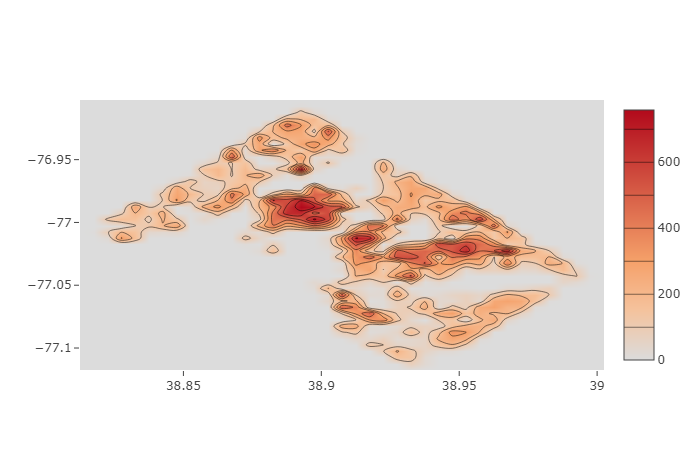

In [9]:
from IPython.display import Image
Image("Data/Offline1.png")

As we can see above that the city center appears to be the most populated area in this dataset. Potentially meaning there are more homes in this area. The assumption here is that this area will have a lot of smaller properties, potentially more older builds. You can also see little clusters of homes spread around the city. The interesting part would be to identify the types homes in each of these little pockets.

In order to better understand the different types of homes in our data set we will try to see if they cluster cleanly into different groups. The final step of our data prep is to prepare our data for clustering. As GBA is a much larger number than the rest of the values in our data set we will scale the data in order to not let GBA drive a lot of the clustering decisions.

We also one hot-encode any of our categorical variables.

Finally due to the size of our data we have chosen to use a small sample of 10,000 observations for clustering the results. Once we identify a clustering that is ideal for this data on the sample we can implement that cluster by training a classifier on that data. We will discuss this further in the implementation portion.

In [22]:
from sklearn.preprocessing import StandardScaler

# select vars for closturing
clusVar = ['BATHRM','BEDRM','ROOMS','AYB','GBA','STRUCT','LATITUDE','LONGITUDE']
clus = df[clusVar].sample(n=10000)

#one hot encode categorical
catvar = ['STRUCT']
tmp_df1 = pd.get_dummies(clus[catvar].astype(str))
clus = pd.concat((clus,tmp_df1),axis=1)

# mapping = {'Y': 1, 'N': 0}
# clus = clus.replace({'AC': mapping})
# clus['AC']=clus['AC'].astype(np.int64)

# Delete unnecessary attributes
clus.drop(['STRUCT'], axis=1, inplace=True)
clus.info()

scl_obj = StandardScaler()
scl_obj.fit(clus)
tmp = scl_obj.transform(clus)

tmp.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 64786 to 1053
Data columns (total 15 columns):
BATHRM       10000 non-null int64
BEDRM        10000 non-null int64
ROOMS        10000 non-null int64
AYB          10000 non-null int64
GBA          10000 non-null int64
LATITUDE     10000 non-null float64
LONGITUDE    10000 non-null float64
STRUCT_0     10000 non-null uint8
STRUCT_1     10000 non-null uint8
STRUCT_2     10000 non-null uint8
STRUCT_4     10000 non-null uint8
STRUCT_5     10000 non-null uint8
STRUCT_6     10000 non-null uint8
STRUCT_7     10000 non-null uint8
STRUCT_8     10000 non-null uint8
dtypes: float64(2), int64(5), uint8(8)
memory usage: 703.1 KB


(10000, 15)

### Modeling and Evaluation 1

#### K-means model

In [11]:
# do it for the k-means
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [3,5,7,9,11]

for n_clusters in range_n_clusters:
    kmeans_model = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = kmeans_model.fit_predict(tmp)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(tmp, cluster_labels)
    #X = np.column_stack((X,pd.get_dummies(cluster_labels)))
    #acc = cross_val_score(lr_clf,X,y=y,cv=5)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg,2),
        # "Average accuracy (with kmeans for class/fare)= ", round(acc.mean()*100,2), "+-", round(acc.std()*100,2)
         )

For n_clusters = 3 The average silhouette_score is : 0.18
For n_clusters = 5 The average silhouette_score is : 0.3
For n_clusters = 7 The average silhouette_score is : 0.28
For n_clusters = 9 The average silhouette_score is : 0.31
For n_clusters = 11 The average silhouette_score is : 0.31


Based on the above and using the average silhouette_score it would appear that a k= 5 is best performing, although this is not the most ideal clustering we will use this model moving forward and evaluate it more thoroughly to understand how each cluster is doing.

In [12]:
# do it for the k-means
from sklearn.cluster import KMeans
n_clusters = 5

kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(tmp)
labels = kmeans_model.labels_

clus['cluster'] = labels
clus.cluster.value_counts()

2    3867
0    2856
1    1701
3    1197
4     379
Name: cluster, dtype: int64

### Modeling and Evaluation 2

##### K-Means

From above we were able to determine the appropriate number of clusters for our data is 3. This was judged by assessing the silhoette scores for each of the clusters. In order to better asses these clusters we looked at the silhouette scores between clusters as well as a plot of the clusters based on there first 2 principle components. Those 2 only explain ~33% of the variability in the data but hopefully these should give us an idea of how well the component seperated.

In [13]:
from sklearn import decomposition
# use the same vars to get the 2 primary pca for plottting
pca = decomposition.PCA(n_components=2)
pca.fit(tmp)
pc_1 = pca.transform(tmp)

#join thos PCA with the sample clustering set
clus['pc1'] = pc_1[:,0]
clus['pc2'] = pc_1[:,1]
print("Explained Variance: ", pca.explained_variance_ratio_ )

Explained Variance:  [0.22142851 0.11245391]


Text(0.5,0.98,'Silhouette analysis for KMeans clustering on sample data with n_clusters = 5')

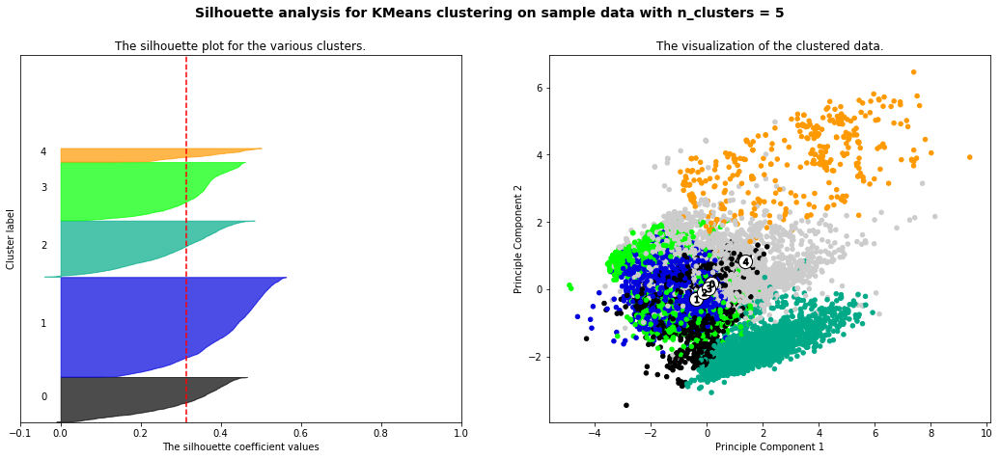

In [14]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(tmp) + (n_clusters + 1) * 10])

silhouette_avg = silhouette_score(tmp, cluster_labels)
# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(tmp, cluster_labels)

y_lower = 10
for i in range(n_clusters):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[cluster_labels == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("The silhouette plot for the various clusters.")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
ax2.scatter(clus['pc1'], clus['pc2'], s=20,
           c=colors)

# Labeling the clusters
centers = kmeans_model.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
           c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("The visualization of the clustered data.")
ax2.set_xlabel("Principle Component 1")
ax2.set_ylabel("Principle Component 2")

plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
             "with n_clusters = %d" % n_clusters),
            fontsize=14, fontweight='bold')

The two plots above show two means of evaluating our cluster. The plot of the left shows the silhouette coefficient for each of the observations in assigned to each of the clusters. Ideally all of these would be as close to 1 as possible. Negative values indicate that observation could have been clustered incorrectly or easily clustered into another class. So for above we see that cluster 1 is potentially not a very good cluster from this set, and indication that this may not be a good clustering.

The width of the bars indicate the number of observations assigned to each cluster. Which in this case we see some inequality amongst the different classes with clust 2 being very narrow.

Then finally the red bar on the left plot shows the average silhouette score for all obsvations. For this set it appears to be at .31 which is a good indicationt that this is most likely not an ideal clustering.

The plot on the right shows how the clusters are seperated when using the first 2 princple components. Ideally we would see 5 distince groupings. Also on that plot is the cluster centers. Again ideally these would be much farther apart indicating the clusters we clearly seperable, however the majority of them are right on top each other.

All in all the above shows that potentially this clustering does not appear to be ideal. However, these clusters can better be evaluated using a more qualitative method, which explore below.

### Modeling and Evaluation 3

#### K-means

The first characteristics of the K-means clusters that we want to evaluate is the locations of the homes and how those we clustered out. Below we look at the contour map of the homes by lat/lon and how they were clustered.

In [15]:
for c in range(n_clusters):
    data = clus[clus.cluster == c]
    print('----------------------------------------------------------------------------------')
    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
    print("Plot of Cluster %d" % c)
    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
    print('----------------------------------------------------------------------------------')
    x = data.LATITUDE
    y = data.LONGITUDE
    iplot([go.Histogram2dContour(x=x, y=y, contours=dict(coloring='heatmap'))], show_link=False)

----------------------------------------------------------------------------------
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Plot of Cluster 0
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
----------------------------------------------------------------------------------


----------------------------------------------------------------------------------
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Plot of Cluster 1
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
----------------------------------------------------------------------------------


----------------------------------------------------------------------------------
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Plot of Cluster 2
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
----------------------------------------------------------------------------------


----------------------------------------------------------------------------------
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Plot of Cluster 3
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
----------------------------------------------------------------------------------


----------------------------------------------------------------------------------
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Plot of Cluster 4
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
----------------------------------------------------------------------------------


Cluster 0, 3, & 4 seem to focus around the city center. This may be a result of the number of observations in this area. Further explortation of the different home types between them should provide more insights.

Cluster 1 appears to be made up of a lot of homes in the northen outskirts of the city. This would include neighborhoods like Brentwood and Catholic university. When looking at the spread accross various neighborhoods in this cluster supports that this potentially is not a good cluster for our data. 

Then finally cluster 2 is largely populated with homes in the western & eastern corner of the city. These are actually pretty different neighborhoods, but the clusters focus on that specific geographic area so perhaps the home types will provide more insights.

Now that we have evaluated the K-means model by they geographic location, lets look at some of the other continous variables in between clusters and see how the model seperated them.

<Figure size 360x360 with 0 Axes>

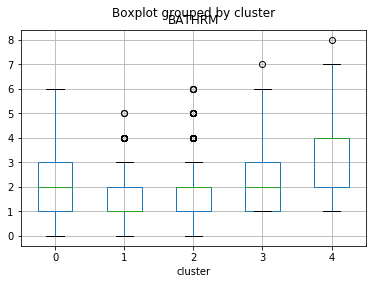

<Figure size 360x360 with 0 Axes>

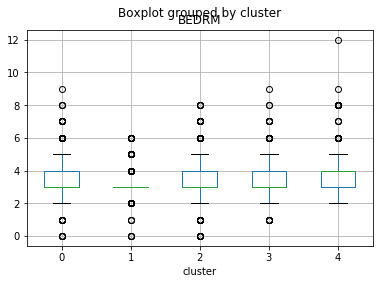

<Figure size 360x360 with 0 Axes>

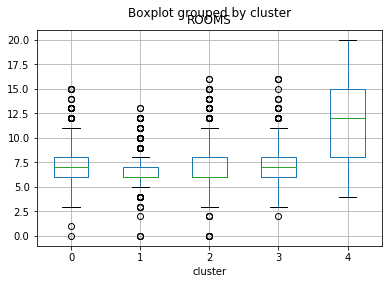

<Figure size 360x360 with 0 Axes>

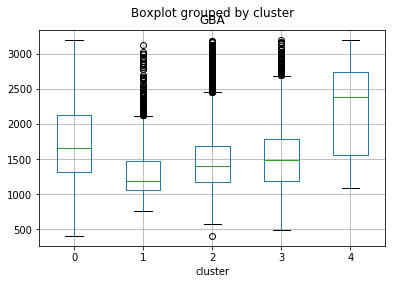

<Figure size 360x360 with 0 Axes>

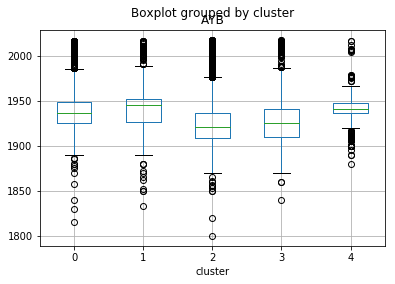

In [16]:
# manually set the continuous variables to compare
vars_to_plot_separate = [['BATHRM'],
                         ['BEDRM'],
                         ['ROOMS'],
                         ['GBA'],
                         ['AYB']]

# box plot by all clusters
for index, plot_vars in enumerate(vars_to_plot_separate):
    plt.figure(figsize=(5, 5))
    ax = clus.boxplot(column=plot_vars, by='cluster')
plt.show()

From above we can really see that cluster 2 appears to be made of up larger homes than the other 4 groups. Additionally we see cluster 4 being made up of some of the smallest homes, perhaps explaining some of the difference between cluster 0 & 3 which populates a lot of the same area.. 

When looking at the AYB, homes in cluster 2 do appear to be a little newer, where homes in cluster 0 appear to be a little older. This makes sense when paired with the location information above. As Cluster 2 is largely made up of homes on the outskirts of town then would have been built later as the city was growing. Cluster 0 is right in the city center where many of the first homes would have been built.

Next we will evaluate how the different categorical varables were clustered out.

In [17]:
tmp_df = pd.concat((clus['cluster'],tmp_df1),axis=1)
tmp_df.head()

clusterStat = tmp_df.groupby(['cluster']).mean().T
# clusterStat
clusterStat = (clusterStat*100).astype('int64')

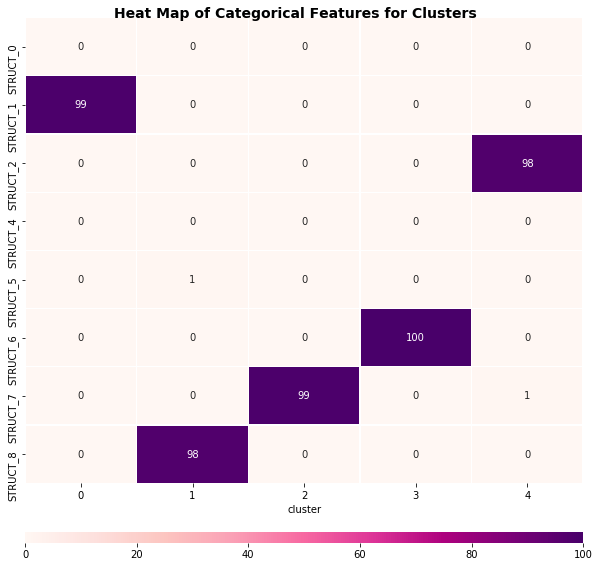

In [18]:
fig3, ax = plt.subplots(figsize=(10, 10))
fig3.subplots_adjust(top=.965)
plt.suptitle('Heat Map of Categorical Features for Clusters', fontsize=14, fontweight='bold')

cbar_kws = {'orientation':"horizontal", 'pad':0.08, 'aspect':50}
sns.heatmap(clusterStat, annot=True, fmt='d', linewidths=.3, ax=ax, cmap='RdPu', cbar_kws=cbar_kws)

From above it seems that the clustering picked out the the specific structure type for each of the clusters:

Cluster 0 begin made up of row homes, which given its relative location to the city center makes sense.

Cluster 1 is made up of single family homes. This cluster is largely represented towards the outskirts of town, in what is likely a more suburban area.

Cluster 2 is almost entirely multi-family homes. Considering the focused location of this cluster and size of this cluster it represents a relatively small portion of the overall data set.

Cluster 3 is row end homes, so essentially only has a single neighbor on one side. Given the overall similarities between cluster 0 & 3 this seems to be one of the only differentiators.

Cluster 4 is semi-detached homes. Given that this group is largely smaller newer builds perhaps this type of style 

### Modeling and Evaluation 4

##### K-means

Overall the 3 class k-means model selected using the silhouette score did not do a great job at providing clean insightful clusters that could be leveraged when guiding potential homebuyers in there decisions..... BLAH BLAH BLAH WRITE WRITE WRITE

### Deployment

The clusterings above would need to be reviewed and determined whether they are sufficient. In this case the realty team that would need to review the findings and determine if clusters identified are in line with how they thing about homes or would generate potential lists of homes for home buyers. 

If the clusterings are identified to be sufficient on deployment strategy would to then use those clusterings determined by the sample as a labeled class. Using the labeled classes in the sample set could train a classifier that would accurately predict the labels. This model would allow us to easily classify the remaining homes in our set without requiring excessive amounts of computational resources. Additionally, it would provide a model for classifying all new homes as they enter into the database, without having to re-cluster the entire database each time a new home is added.

Then the final labeled dataset and the corresponding information could be loaded into a local database. Ideally, a simple dashboard or interface could be developed using Tableau or some other visualization software. This would provide the agents a means to explore the homes and carefully & quickly curate a list of homes for potential buyers. 

### Appendix 

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100089 entries, 0 to 100088
Data columns (total 26 columns):
OBJECTID           100089 non-null int64
SSL                100089 non-null object
BATHRM             100089 non-null int64
HF_BATHRM          100089 non-null int64
HEAT               100089 non-null int64
AC                 100089 non-null object
NUM_UNITS          100089 non-null int64
ROOMS              100089 non-null int64
BEDRM              100089 non-null int64
AYB                100089 non-null int64
STORIES            100089 non-null int64
SALE_NUM           100089 non-null int64
GBA                100089 non-null int64
STYLE              100089 non-null int64
STRUCT             100089 non-null int64
EXTWALL            100089 non-null int64
ROOF               100089 non-null int64
INTWALL            100089 non-null int64
KITCHENS           100089 non-null int64
FIREPLACES         100089 non-null int64
LANDAREA           100089 non-null int64
YR_RMDL_ClASS      100089 

- OBJECTID: Auto-generated internal unique ID
- SSL: Square, suffix, lot ID
- BATHRM: Number of full bathrooms
- HF_BATHRM: Number of half bathrooms (no shower or tub)
- HEAT: Heating code
    - 0: No Data
    - 1: Forced Air
    - 2: Air-Oil
    - 3: Wall Furnace
    - 4: Electric Rad
    - 5: Elec Base Brd
    - 6: Water Base Brd
    - 7: Warm Cool
    - 8: Ht Pump
    - 9: Evp Cool
    - 10: Air Exchng
    - 11: Gravity Furnac
    - 12: Ind Unit
    - 13: Hot Water Rad
- AC: Air conditioning (Y/N)
- NUM_UNITS: Number of units
- ROOMS: Number of rooms
- BEDRM: Number of bedrooms
- AYB: The earliest time the main portion of the building was built. It is not affected by subsequent construction.
- STORIES: Stories
- SALE_NUM: Sale number
- GBA: Gross building area in square feet
- STYLE: Style code
    - 0: Default
    - 1: 1 Story
    - 2: 1.5 Story Unfin
    - 3: 1.5 Story Fin
    - 4: 2 Story
    - 5: 2.5 Story Unfin
    - 6: 2.5 Story Fin
    - 7: 3 Story
    - 8: 3.5 Story
    - 9: 3.5 Story Fin
    - 10: 4 Story
    - 11: 4.5 Story Unfin
    - 12: 4.5 Story Fin
    - 13: Bi-Level
    - 14: Split Level
    - 15: Split Foyer
    - 94: Outbuildings
    - 99: Vacant
- STRUCT: Structure code
    - 0: Default
    - 1: Single
    - 2: Multi
    - 4: Town End
    - 5: Town Inside
    - 6: Row End
    - 7: Row Inside
    - 8: Semi-Detached
    - 13: Vacant Land
- EXTWALL: Exterior wall code
    - 0: Default              
    - 1: Plywood
    - 2: Hardboard
    - 3: Metal Siding
    - 4: Vinyl Siding
    - 5: Stucco
    - 6: Wood Siding
    - 7: Shingle
    - 8: SPlaster
    - 9: Rustic Log
    - 10: Brick Veneer
    - 11: Stone Veneer
    - 12: Concrete Block
    - 13: Stucco Block
    - 14: Common Brick
    - 15: Face Brick
    - 16: Adobe
    - 17: Stone
    - 18: Concrete
    - 19: Aluminum
    - 20: Brick/Stone
    - 21: Brick/Stucco
    - 22: Brick/Siding
    - 23: Stone/Stucco
    - 24: Stone/Siding
- ROOF: Roof type code
    - 0: Typical
    - 1: Comp Shingle
    - 2: Built Up
    - 3: Shingle
    - 4: Shake
    - 5: Metal- Pre
    - 6: Metal- Sms
    - 7: Metal- Cpr
    - 8: Composition Ro
    - 9: Concrete Tile
    - 10: Clay Tile
    - 11: Slate
    - 12: Concrete
    - 13: Neopren
    - 14: Water Proof
    - 15: Wood- FS
- INTWALL: Interior wall code
    - 0: Default
    - 1: Resiliant
    - 2: Carpet
    - 3: Wood Floor
    - 4: Ceramic Tile
    - 5: Terrazo
    - 6: Hardwood
    - 7: Parquet
    - 8: Vinyl Comp
    - 9: Vinyl Sheet
    - 10: Lt Concrete
    - 11: Hardwood/Carp
- KITCHENS: Number of kitchens
- FIREPLACES: Number of fireplaces
- LANDAREA: Land area of property in square feet
- LATITUDE: Lattitude of address
- LONGITUDE: Longitude of Address
- ASSESSMENT_NBHD: DC Neighborhood
- WARD: DC Wards

In [20]:
df.groupby(['WARD']).OBJECTID.count()

WARD
Ward 1     7647
Ward 2     4985
Ward 3    11749
Ward 4    19539
Ward 5    17575
Ward 6    15440
Ward 7    14616
Ward 8     8538
Name: OBJECTID, dtype: int64

In [21]:
df.groupby(['ASSESSMENT_NBHD']).OBJECTID.count()

ASSESSMENT_NBHD
16th Street Heights              1846
American University              2277
Anacostia                        1562
Barry Farms                       347
Berkley                           386
Brentwood                         694
Brightwood                       3666
Brookland                        5420
Burleith                          760
Capitol Hill                     2926
Central-tri 1                     159
Chevy Chase                      4361
Chillum                           843
Cleveland Park                    847
Colonial Village                  507
Columbia Heights                 5038
Congress Heights                 3734
Crestwood                         647
Deanwood                         5555
Eckington                        1730
Foggy Bottom                      248
Forest Hills                      496
Fort Dupont Park                 3091
Fort Lincoln                      607
Foxhall                           364
Garfield                          